# Re-analsysis of Eomes KO in vitro data from Luke Harland et al, NCB

In [1]:
suppressPackageStartupMessages({
   # library(tidyr)
    library(ggrastr)
    library(viridis)
    library(gridExtra)
    library(scran)
    library(scater)
    library(scuttle)
    library(batchelor)
})

here::i_am("rna/processing/1_create_seurat_rna.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code

Warning message:
“package ‘rtracklayer’ was built under R version 4.2.3”


In [4]:
## I/O ##
io$haem_landscape = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_old/mapping_ivan'
io$mapping_ivan = file.path(io$haem_landscape, 'LukesGrantMapping')
io$plotdir = file.path(io$basedir, 'results/rna_old/mapping_ivan/plots')
dir.create(io$plotdir, recursive=TRUE, showWarnings =FALSE)
io$outdir = file.path(io$basedir, 'results/rna/NCB_reanalysis/')
dir.create(io$outdir, recursive=TRUE, showWarnings =FALSE)

In [5]:
eomes_ncb_mapping_D4WT = as.data.table(readRDS(file.path(io$mapping_ivan, "eomes_public/GSM4153428_scRNA_WT_D4.mapping.rds"))) %>%
                                  .[,cell:=gsub('map', 'D4WT', gsub('-1', '', cell))] 
eomes_ncb_mapping_D5WT = as.data.table(readRDS(file.path(io$mapping_ivan, "eomes_public/GSM4153429_scRNA_WT_D5.mapping.rds"))) %>%
                                  .[,cell:=gsub('map', 'D5WT', gsub('-1', '', cell))]
eomes_ncb_mapping_D4MT = as.data.table(readRDS(file.path(io$mapping_ivan, "eomes_public/GSM4153430_scRNA_Eomes_null_D4.mapping.rds"))) %>%
                                  .[,cell:=gsub('map', 'D4MT', gsub('-1', '', cell))]
eomes_ncb_mapping_D5MT = as.data.table(readRDS(file.path(io$mapping_ivan, "eomes_public/GSM4153431_scRNA_Eomes_null_D5.mapping.rds"))) %>%
                                  .[,cell:=gsub('map', 'D5MT', gsub('-1', '', cell))]


eomes_ncb_mapping = rbind(eomes_ncb_mapping_D4WT, eomes_ncb_mapping_D5WT, eomes_ncb_mapping_D4MT, eomes_ncb_mapping_D5MT)%>%
                                  setnames(c('cell','celltype.mapped_ext', 'stage.mapped_ext', 'closest.cell_ext')) # new colnames

In [6]:
eomes_ncb_meta = as.data.table(readRDS(file.path(io$mapping_ivan, "eomes_public/integrated.rds"))@meta.data, keep.rownames=TRUE) %>%
                                    setnames('rn', 'cell') %>%
                                    .[, cell:=gsub('-1', '', cell)]

eomes_ncb_seurat = readRDS(file.path(io$mapping_ivan, "eomes_public/integrated.rds"))

In [7]:
rename = c("MT" = "Eomes KO")
rename_day = c('4' = 'D4',
               '5' = 'D5')

eomes_ncb_meta_full = merge(eomes_ncb_meta, eomes_ncb_mapping, by='cell') %>% 
                                .[,genotype:=stringr::str_replace_all(genotype, rename)] %>%
                                .[,day:=stringr::str_replace_all(day, rename_day)]

In [8]:
head(eomes_ncb_meta_full)
head(eomes_ncb_meta)
eomes_ncb_seurat

cell,orig.ident,nCount_RNA,nFeature_RNA,genotype,day,percent.mt,integrated_snn_res.0.8,seurat_clusters,celltype.mapped_ext,stage.mapped_ext,closest.cell_ext
<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>
D4MT_AAACCCAAGAGCAAGA,D4MT,17715,4074,Eomes KO,D4,2.895851,12,12,Haematoendothelial progenitors,E7.5,cell_3600
D4MT_AAACCCAAGGCGTTGA,D4MT,19297,4471,Eomes KO,D4,2.513344,7,7,Embryo proper endothelium,E8.75,ext_cell_31684
D4MT_AAACCCACAGCTATTG,D4MT,15448,4038,Eomes KO,D4,3.171932,2,2,Embryo proper endothelium,E8.75,ext_cell_134808
D4MT_AAACCCATCGTCGGGT,D4MT,13979,3538,Eomes KO,D4,3.347879,6,6,Haematoendothelial progenitors,E8.0,cell_127285
D4MT_AAACGAAAGAGTATAC,D4MT,11535,3365,Eomes KO,D4,3.823147,2,2,Haematoendothelial progenitors,-,cell_54914
D4MT_AAACGAACAAAGACTA,D4MT,12640,3571,Eomes KO,D4,3.821203,2,2,Embryo proper endothelium,E8.5,ext_cell_273845


cell,orig.ident,nCount_RNA,nFeature_RNA,genotype,day,percent.mt,integrated_snn_res.0.8,seurat_clusters
<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<dbl>,<fct>,<fct>
D4WT_AAACCCAAGCGTATAA,D4WT,25263,4779,WT,4,3.847524,6,6
D4WT_AAACCCACAAGACAAT,D4WT,41613,6189,WT,4,3.107202,7,7
D4WT_AAACCCATCCGGGACT,D4WT,21319,4630,WT,4,3.541442,6,6
D4WT_AAACCCATCTTCTTCC,D4WT,27449,5174,WT,4,2.488251,1,1
D4WT_AAACGAAAGCCTCTCT,D4WT,28190,5110,WT,4,3.746009,1,1
D4WT_AAACGAACAATCTAGC,D4WT,20245,4545,WT,4,3.274883,2,2


Loading required package: Seurat

Attaching SeuratObject


Attaching package: ‘Seurat’


The following object is masked from ‘package:SummarizedExperiment’:

    Assays




An object of class Seurat 
19941 features across 15220 samples within 2 assays 
Active assay: RNA (17941 features, 0 variable features)
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [9]:
eomes_ncb_sce = as.SingleCellExperiment(eomes_ncb_seurat)

In [10]:
saveRDS(eomes_ncb_sce, file.path(io$outdir, 'eomes_ncb_sce.rds'))

In [11]:
eomes_ncb_sce

class: SingleCellExperiment 
dim: 17941 15220 
metadata(0):
assays(2): counts logcounts
rownames(17941): Xkr4 Sox17 ... Nrap Pnliprp1
rowData names(0):
colnames(15220): D4WT_AAACCCAAGCGTATAA D4WT_AAACCCACAAGACAAT ...
  D5MT_GTCAGCGCAGGCACAA D5MT_TATGTTCAGGTTAGTA
colData names(9): orig.ident nCount_RNA ... seurat_clusters ident
reducedDimNames(0):
mainExpName: RNA
altExpNames(1): integrated

In [24]:
args = list()
args$atlas_sce = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/processed/SingleCellExperiment.rds'
args$atlas_metadata = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/sample_metadata_extended.txt.gz'
test = fread(args$atlas_metadata)

In [69]:
#######
### Remapping to atlas
#######
source(here::here("rna/mapping/run/mnn/mapping_functions_extended.R"))

# Prepare query
sce_query = readRDS(file.path(io$outdir, 'eomes_ncb_sce.rds'))
meta_query = as.data.table(colData(eomes_ncb_sce), keep.rownames = T) %>% setnames('rn', 'cell') %>% 
    .[,sample:=orig.ident]
tmp <- meta_query %>% .[cell%in%colnames(sce_query)] %>% setkey(cell) %>% .[colnames(sce_query)]
stopifnot(tmp$cell == colnames(sce_query))
colData(sce_query) <- tmp %>% as.data.frame %>% tibble::column_to_rownames("cell") %>%
  .[colnames(sce_query),] %>% DataFrame()

# Atlas
args = list()
args$atlas_sce = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/processed/SingleCellExperiment.rds'
args$atlas_metadata = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation/pijuansala2019_gastrulation10x/sample_metadata_extended.txt.gz'
args$atlas_stages = c('E6.5', 'E6.5', 'E7.0', '7.25', 'E7.5', 'E7.75', 'E8.0', 'E8.25', 'E8.5', 'mixed_gastrulation')
args$n_neighbours = 15
args$cosine_normalisation = FALSE

# Load cell metadata
meta_atlas <- fread(args$atlas_metadata) %>%
  .[stage%in%args$atlas_stages] %>%
  .[,sample:=factor(sample)] 

# Load SingleCellExperiment
sce_atlas <- load_SingleCellExperiment(args$atlas_sce, normalise = TRUE, cells = meta_atlas$cell, remove_non_expressed_genes = TRUE)

# Update colData
tmp <- meta_atlas %>% .[cell%in%colnames(sce_atlas)] %>% setkey(cell) %>% .[colnames(sce_atlas)]
stopifnot(tmp$cell == colnames(sce_atlas))
colData(sce_atlas) <- tmp %>% as.data.frame %>% tibble::column_to_rownames("cell") %>%
  .[colnames(sce_atlas),] %>% DataFrame()

# Sanity cehcks
stopifnot(sum(is.na(rownames(sce_atlas)))==0)
stopifnot(sum(duplicated(rownames(sce_atlas)))==0)

# Get gene metadata
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol", "description")] %>%
  .[symbol!="" & ens_id%in%rownames(sce_atlas)] %>%
  .[!duplicated(symbol)]

rownames(sce_atlas) = gene_metadata[match(rownames(sce_atlas), ens_id), symbol]

# Imprinted genes
imprint = gene_metadata[c(grep('maternally', gene_metadata$description),
                       grep('paternally', gene_metadata$description)), symbol]
#Other imprinted genes: 
#- Nnat (https://www.genecards.org/cgi-bin/carddisp.pl?gene=NNAT)
#- Grb10 (https://www.genecards.org/cgi-bin/carddisp.pl?gene=GRB10)

# Intersect genes
genes.intersect <- intersect(rownames(sce_query), rownames(sce_atlas))

# Filter some genes manually
genes.intersect <- genes.intersect[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",genes.intersect,invert=T)] # filter out non-informative genes
genes.intersect <- genes.intersect[grep("^Hbb|^Hba",genes.intersect,invert=T)] # test removing Haem genes 
genes.intersect <- genes.intersect[!genes.intersect %in% c(imprint, 'Grb10', 'Nnat')] # remove imprinted genes
genes.intersect <- genes.intersect[!genes.intersect %in% c("Xist", "Tsix")] # remove Xist & Tsix
genes.intersect <- genes.intersect[!genes.intersect=="tomato-td"] # remove tomato itself
genes.intersect <- genes.intersect[!genes.intersect %in% gene_metadata[chr=="chrY",symbol]] # no genes on y-chr 

# Subset SingleCellExperiment objects
sce_query  <- sce_query[genes.intersect,]
sce_atlas <- sce_atlas[genes.intersect,]

# Load gene statistics from the atlas
gene_stats.dt <- fread(paste0(io$atlas.basedir,"/results/gene_statistics/gene_statistics.txt.gz")) %>%
.[gene%in%genes.intersect]
genes_to_use <- gene_stats.dt %>% setorder(-var_pseudobulk, na.last = T) %>% head(n=2500) %>% .$gene  

stopifnot(genes_to_use%in%rownames(sce_atlas))
stopifnot(genes_to_use%in%rownames(sce_query))

sce_query = sce_query[genes_to_use,]
sce_atlas = sce_atlas[genes_to_use,]


Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [70]:
mapping_full = mclapply(unique(meta_query$sample), function(x){
    mapping  <- mapWrap(
          sce_atlas = sce_atlas,
          meta_atlas = meta_atlas,
          sce_query = sce_query[,meta_query[sample==x, cell]],
          meta_query = meta_query[sample==x, ],
          genes = genes_to_use,
          npcs = args$npcs,
          k = args$n_neighbours,
          cosineNorm = args$cosine_normalisation,
          order = NULL
        )
    
    mapping.dt <- mapping$mapping %>% 
      .[,c("cell","celltype.mapped","celltype.score","celltype_extended.mapped","celltype_extended.score","stage.mapped", "cellstage.score", "closest.cell")] %>% 
      as.data.table
    
    return(mapping.dt)
}, mc.cores=4) %>% rbindlist()

In [71]:
head(mapping_full)

cell,celltype.mapped,celltype.score,celltype_extended.mapped,celltype_extended.score,stage.mapped,cellstage.score,closest.cell
<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
D4WT_AAACCCAAGCGTATAA,Haematoendothelial_progenitors,1.0000000,Allantois_endothelium,0.5333333,E8.0,0.5333333,cell_51290
D4WT_AAACCCACAAGACAAT,Mesenchyme,1.0000000,Lateral_plate_mesoderm,0.9333333,E7.5,0.4666667,cell_57132
D4WT_AAACCCATCCGGGACT,Haematoendothelial_progenitors,1.0000000,Haematoendothelial_progenitors,1.0000000,E7.0,0.8000000,cell_107254
D4WT_AAACCCATCTTCTTCC,Haematoendothelial_progenitors,0.9333333,Haematoendothelial_progenitors,1.0000000,E7.0,0.4666667,cell_58961
D4WT_AAACGAAAGCCTCTCT,Haematoendothelial_progenitors,1.0000000,Haematoendothelial_progenitors,0.8666667,E7.0,0.5333333,cell_61732
D4WT_AAACGAACAATCTAGC,Mixed_mesoderm,0.6666667,Nascent_mesoderm,0.9333333,E7.0,0.7333333,cell_109027


In [74]:
meta_full = merge(meta_query, mapping_full, by='cell') %>% 
    .[match(colnames(sce_query), cell)] %>% 
    merge(., meta_atlas[,c('cell', 'umapX', 'umapY')], by.x = 'closest.cell', by.y = 'cell')

In [75]:
head(meta_full)

closest.cell,cell,orig.ident,nCount_RNA,nFeature_RNA,genotype,day,percent.mt,integrated_snn_res.0.8,seurat_clusters,ident,sample,celltype.mapped,celltype.score,celltype_extended.mapped,celltype_extended.score,stage.mapped,cellstage.score,umapX,umapY
<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<dbl>,<fct>,<fct>,<fct>,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>
cell_100078,D5WT_TACTTACCAGGCAATG,D5WT,7277,2461,WT,5,2.720901,3,3,3,D5WT,Endothelium,0.6666667,Allantois_endothelium,0.4666667,E8.0,0.4666667,-2.511317,14.35762
cell_100078,D5MT_GAAGAATCACACCTGG,D5MT,10260,2984,MT,5,3.070175,3,3,3,D5MT,Endothelium,0.6000000,Venous_endothelium,0.7333333,E8.5,0.6000000,-2.511317,14.35762
cell_100078,D5MT_ATTACCTTCCAACACA,D5MT,9835,3359,MT,5,4.168785,3,3,3,D5MT,Haematoendothelial_progenitors,0.6000000,Venous_endothelium,0.6000000,E8.5,0.4666667,-2.511317,14.35762
cell_100292,D4MT_ATTCTACCACAAACGG,D4MT,13830,3767,MT,4,2.848879,8,8,8,D4MT,Haematoendothelial_progenitors,0.5333333,Venous_endothelium,0.6000000,E8.5,0.4666667,-2.048206,14.47843
cell_100292,D4MT_ATCGGCGGTTCGATTG,D4MT,13452,3458,MT,4,2.928933,4,4,4,D4MT,Haematoendothelial_progenitors,0.8000000,Allantois_endothelium,0.7333333,E7.75,0.4000000,-2.048206,14.47843
cell_100292,D5MT_GCTTGGGAGCACGGAT,D5MT,15922,3771,MT,5,2.989574,0,0,0,D5MT,Endothelium,0.8666667,Venous_endothelium,1.0000000,E8.5,0.8000000,-2.048206,14.47843


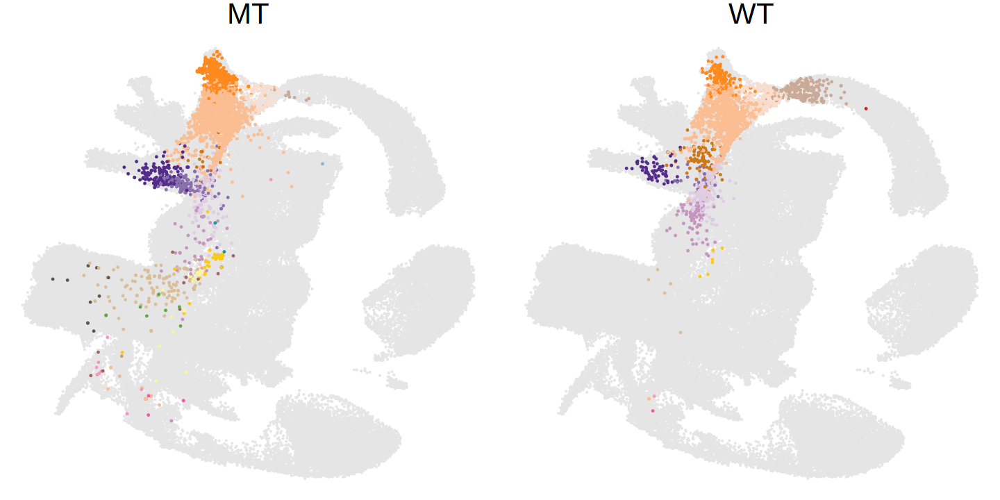

In [86]:
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(meta_full, aes(umapX, umapY, color = celltype.mapped)) + 
    geom_point(data = meta_atlas, color = 'grey90', size=0.1) + 
    geom_point(size = 0.3) + 
    scale_color_manual(values = opts$celltype.colors) + 
    facet_wrap(~genotype) +
    theme_void() + 
    theme(legend.position = 'none',
         strip.text = element_text(size = 25))

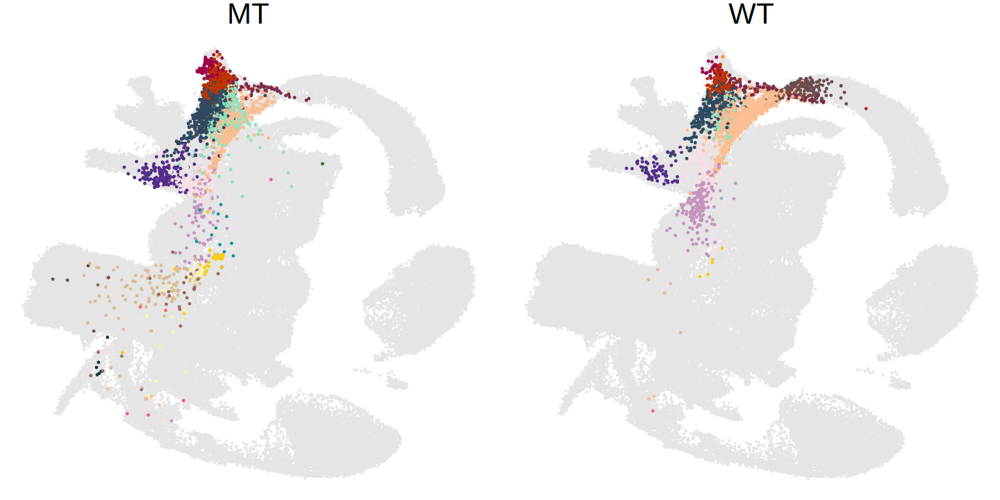

In [88]:
options(repr.plot.width = 12, repr.plot.height = 6)
ggplot(meta_full, aes(umapX, umapY, color = celltype_extended.mapped)) + 
    geom_point(data = meta_atlas, color = 'grey90', size=0.1) + 
    geom_point(size = 0.3) + 
    scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_wrap(~genotype) +
    theme_void() + 
    theme(legend.position = 'none',
         strip.text = element_text(size = 25))

In [94]:
summary(meta_full$cell == colnames(sce_query))

   Mode   FALSE    TRUE 
logical   15219       1 

In [104]:
sce_query = readRDS(file.path(io$outdir, 'eomes_ncb_sce.rds'))
sce_query = logNormCounts(sce_query)

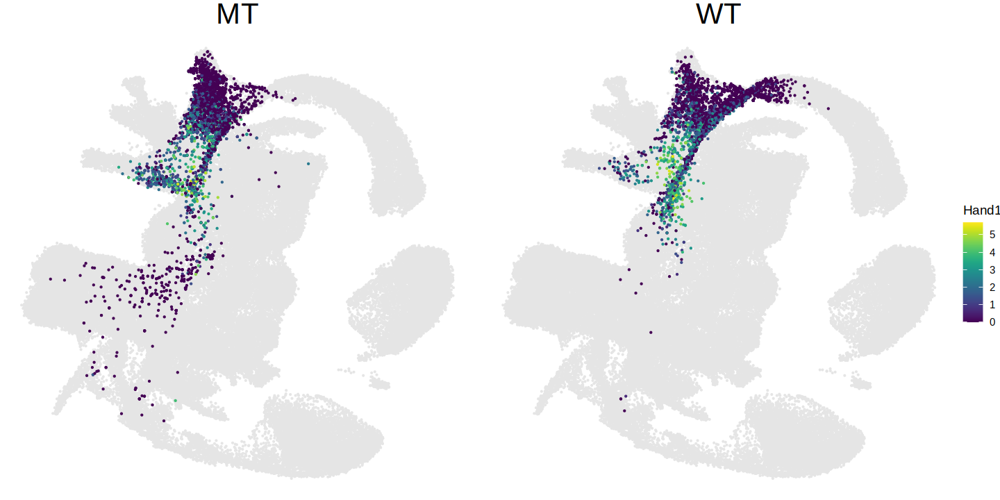

In [122]:
options(repr.plot.width = 12, repr.plot.height = 6)
sce_query = sce_query[,meta_full$cell]
gene = 'Hand1'
meta_full$gene =  as.vector(logcounts(sce_query[gene,]))
#meta_full = meta_full[order(gene)]
ggplot(meta_full, aes(umapX, umapY, color = gene)) + 
    geom_point(data = meta_atlas, color = 'grey90', size=0.1) + 
    geom_point(size = 0.15) + 
    viridis::scale_color_viridis(name = gene) + 
  #  scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_wrap(~genotype) +
    theme_void() + 
    theme(legend.position = 'right',
         strip.text = element_text(size = 25))

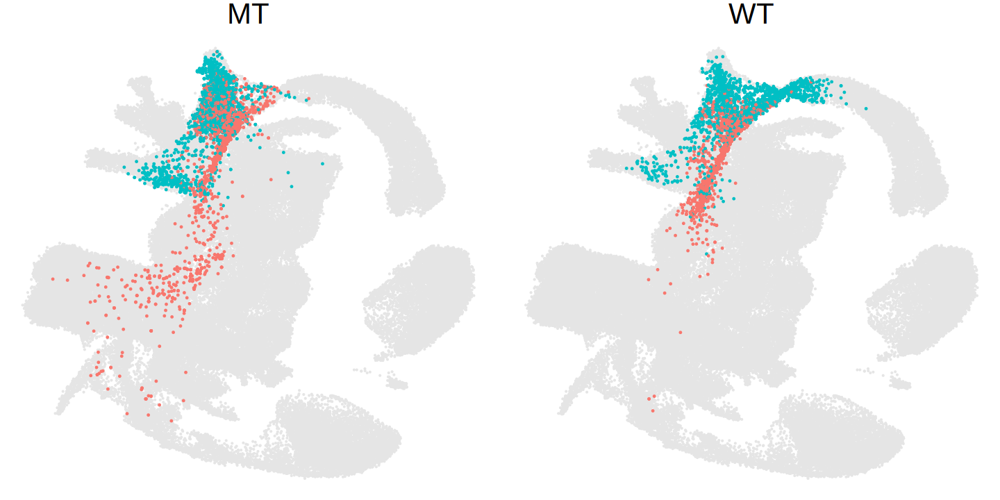

In [93]:
options(repr.plot.width = 12, repr.plot.height = 6)
meta_full$gene =  as.vector(logcounts(sce_query['Runx1',]))
meta_full = meta_full[order(gene)]
ggplot(meta_full, aes(umapX, umapY, color = day)) + 
    geom_point(data = meta_atlas, color = 'grey90', size=0.1) + 
    geom_point(size = 0.3) + 
    # viridis::scale_color_viridis() + 
  #  scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_wrap(~genotype) +
    theme_void() + 
    theme(legend.position = 'none',
         strip.text = element_text(size = 25))

In [123]:
head(meta_full)

closest.cell,cell,orig.ident,nCount_RNA,nFeature_RNA,genotype,day,percent.mt,integrated_snn_res.0.8,seurat_clusters,⋯,sample,celltype.mapped,celltype.score,celltype_extended.mapped,celltype_extended.score,stage.mapped,cellstage.score,umapX,umapY,gene
<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<dbl>,<fct>,<fct>,⋯,<chr>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
cell_100078,D5WT_TACTTACCAGGCAATG,D5WT,7277,2461,WT,5,2.720901,3,3,⋯,D5WT,Endothelium,0.6666667,Allantois_endothelium,0.4666667,E8.0,0.4666667,-2.511317,14.357622,0.000000
cell_100557,D5MT_AGATGCTGTACTCCCT,D5MT,8046,2557,MT,5,3.803132,3,3,⋯,D5MT,Endothelium,1.0000000,Endocardium,0.9333333,E8.5,0.8000000,-2.130248,16.959700,0.000000
cell_101376,D5MT_TCGGATATCTCGAACA,D5MT,12333,3333,MT,5,2.602773,0,0,⋯,D5MT,Endothelium,1.0000000,Endocardium,1.0000000,E8.5,0.8000000,-2.289711,16.706269,0.000000
cell_101951,D5MT_TCTCCGAAGTATGGAT,D5MT,7482,2581,MT,5,2.913659,3,3,⋯,D5MT,Endothelium,0.6000000,Venous_endothelium,0.7333333,E8.25,0.4000000,-1.376692,15.011686,0.000000
cell_103459,D5WT_CCGAACGGTCGCATGC,D5WT,15364,3650,WT,5,2.076282,9,9,⋯,D5WT,Haematoendothelial_progenitors,1.0000000,Haematoendothelial_progenitors,1.0000000,E7.0,0.8666667,-1.966085,8.737083,4.528888
cell_106691,D4WT_GTCTGTCCAAATGGCG,D4WT,24077,4603,WT,4,3.301906,2,2,⋯,D4WT,Mixed_mesoderm,0.8000000,Nascent_mesoderm,0.5333333,E7.0,0.7333333,-1.933650,8.686829,0.000000


In [144]:
prop = meta_full %>% copy() %>%
    .[,tot := .N, by = 'sample'] %>%
    .[,prop := .N/tot, by = c('celltype_extended.mapped', 'sample')] %>% 
    unique(by = c('celltype_extended.mapped', 'sample'))

In [154]:
sum(prop[sample == 'D5MT', prop])

[1] 1

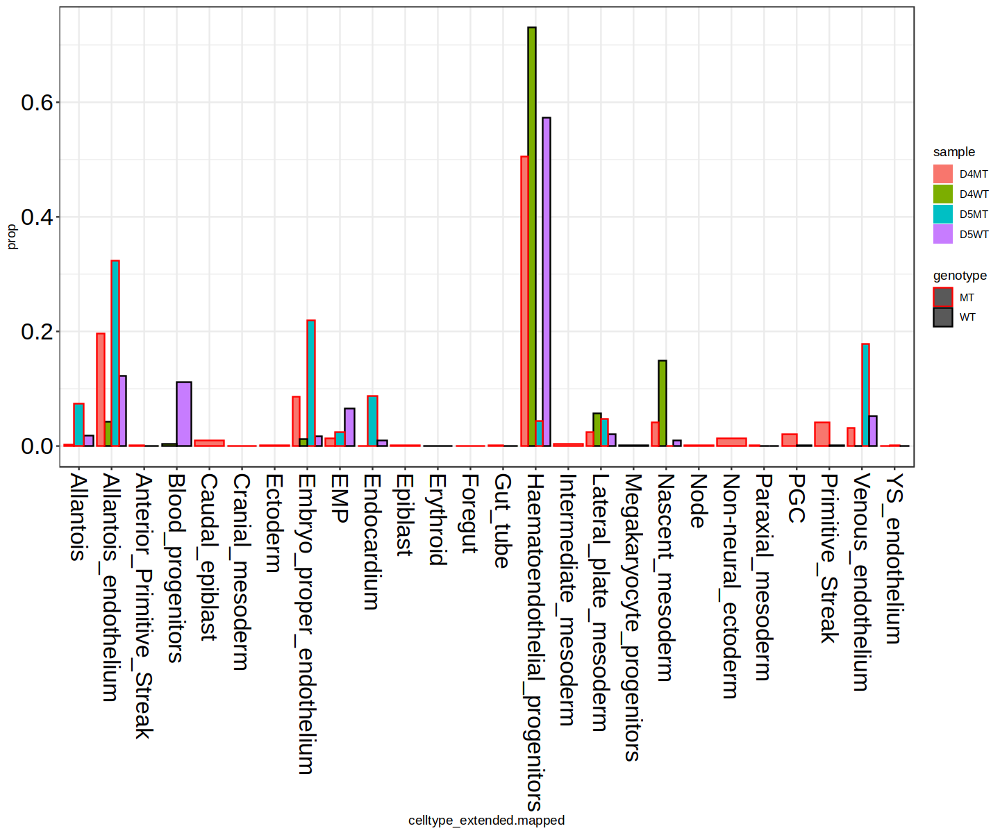

In [150]:
options(repr.plot.width = 12, repr.plot.height = 10)
ggplot(prop, aes(celltype_extended.mapped, prop, fill = sample, color = genotype)) + 
    geom_bar(stat = 'identity', position = 'dodge', linewidth = 0.5) + 
    scale_color_manual(values = c('MT' = 'red', 'WT' = 'black')) + 
    # scale_fill_manual(values = c('4' = 'purple', '5' = 'lightblue')) + 
    theme_bw() + 
    theme(axis.text.x = element_text(angle=-90, vjust = 0.5, hjust = 0, color='black', size = 20),
         axis.text.y = element_text(color='black', size = 20))

In [125]:
head(prop)

closest.cell,cell,orig.ident,nCount_RNA,nFeature_RNA,genotype,day,percent.mt,integrated_snn_res.0.8,seurat_clusters,⋯,celltype.score,celltype_extended.mapped,celltype_extended.score,stage.mapped,cellstage.score,umapX,umapY,gene,tot,prop
<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<chr>,<dbl>,<fct>,<fct>,⋯,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>
cell_100078,D5WT_TACTTACCAGGCAATG,D5WT,7277,2461,WT,5,2.720901,3,3,⋯,0.6666667,Allantois_endothelium,0.4666667,E8.0,0.4666667,-2.5113173,14.357622,0.000000,3805,0.07148489
cell_100557,D5MT_AGATGCTGTACTCCCT,D5MT,8046,2557,MT,5,3.803132,3,3,⋯,1.0000000,Endocardium,0.9333333,E8.5,0.8000000,-2.1302481,16.959700,0.000000,3805,0.25361367
cell_103459,D5WT_CCGAACGGTCGCATGC,D5WT,15364,3650,WT,5,2.076282,9,9,⋯,1.0000000,Haematoendothelial_progenitors,1.0000000,E7.0,0.8666667,-1.9660847,8.737083,4.528888,3805,0.44441524
cell_106691,D4WT_GTCTGTCCAAATGGCG,D4WT,24077,4603,WT,4,3.301906,2,2,⋯,0.8000000,Nascent_mesoderm,0.5333333,E7.0,0.7333333,-1.9336499,8.686829,0.000000,3805,0.19053876
cell_110623,D4WT_CGTGAATGTGGCTGCT,D4WT,24753,4874,WT,4,3.757120,1,1,⋯,1.0000000,Haematoendothelial_progenitors,1.0000000,E7.0,0.8000000,-0.7130176,11.936225,0.000000,3805,0.68567674
cell_121207,D5MT_TGGTGATGTTGGCCTG,D5MT,7363,2554,MT,5,2.960750,9,9,⋯,1.0000000,Allantois_endothelium,0.8000000,E8.0,0.6000000,-2.4563589,11.889974,1.675575,3805,0.61182654


In [155]:
## Integrate with multiome RNA data

# Metadata
args$metadata = file.path(io$basedir, 'results/rna_atac/clustering/metadata_celltype_annotated_v2.txt.gz')
# RNA_sce
args$rna_sce = file.path(io$basedir, 'processed/rna/SingleCellExperiment.rds')


# Load meta
meta = fread(args$metadata)
# load sce
rna.sce <- load_SingleCellExperiment(args$rna_sce, normalise = TRUE, cells = meta$cell)
colData(rna.sce) = meta %>% as.data.frame() %>% tibble::column_to_rownames('cell') %>% DataFrame()

In [173]:
# Get HVGs
getHVGs <- function(sce, block, min.mean = 1e-3){
  decomp <- modelGeneVar(sce, block=block)
  decomp <- decomp[decomp$mean > min.mean,]
  decomp$FDR <- p.adjust(decomp$p.value, method = "fdr")
  decomp = decomp[order(decomp$FDR),]
  return(head(rownames(decomp), 2500))
}

hvgs_multiome = getHVGs(rna.sce, block = rna.sce$sample)
hvgs_ncb = getHVGs(sce_query[, meta_full$cell], block = meta_full$sample)

In [174]:
rna.sce_filt = rna.sce[intersect(hvgs_multiome, hvgs_ncb),]
sce_query_filt = sce_query[intersect(hvgs_multiome, hvgs_ncb),]

In [176]:
sce_query_filt

class: SingleCellExperiment 
dim: 661 15220 
metadata(0):
assays(2): counts logcounts
rownames(661): Fn1 Pid1 ... 9130230L23Rik Etv2
rowData names(0):
colnames(15220): D5WT_TACTTACCAGGCAATG D5MT_AGATGCTGTACTCCCT ...
  D4MT_GATGGAGTCGTGGCTG D4MT_TCACAAGCAGGCCCTA
colData names(10): orig.ident nCount_RNA ... ident sizeFactor
reducedDimNames(0):
mainExpName: RNA
altExpNames(1): integrated

In [ ]:
sce_query_filt$sa

In [211]:
ncol(rna.sce_filt)

[1] 31596

In [213]:
# Concatenate
sce_all <- SingleCellExperiment(
  list(counts=Matrix::Matrix(cbind(counts(rna.sce_filt),counts(sce_query_filt)),sparse=TRUE))
)
# Log Normalise
sce_all <- multiBatchNorm(sce_all, batch = c(rep('multiome', ncol(rna.sce_filt)), rep('ncb', ncol(sce_query_filt))))

In [214]:
sce_all$block = c(rep('multiome', ncol(rna.sce_filt)), rep('ncb', ncol(sce_query_filt)))

In [215]:
# dimensionality reduction
big_pca <- multiBatchPCA(
    sce_all,
    batch = sce_all$block,
    d = 15,
    preserve.single = TRUE,
    assay.type = "logcounts"
  )[[1]]

In [216]:
# batch correction
# Maybe change big_pca to list and use merge.order
BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 21
correct = reducedMNN(big_pca, batch = sce_all$block, BPPARAM = BPPARAM)

In [217]:
reducedDim(sce_all, "PCA") <- correct$corrected[colnames(sce_all),]


In [219]:
sce_all <- runUMAP(sce_all, dimred="PCA", n_neighbors = 15, min_dist = 0.3)


In [220]:
umap.dt <- reducedDim(sce_all,"UMAP") %>% as.data.table %>% 
  .[,cell:=colnames(sce_all)] %>%
  setnames(c("UMAP1","UMAP2","cell"))

In [317]:
head(meta)

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,⋯,stage.mapped_mnn,cellstage.score_mnn,closest.cell_mnn,celltype_genotype,celltype_extended_genotype,UMAP1,UMAP2,mofa_cluster,celltype_v1,celltype_v2
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<chr>,<chr>
1A_Eo_DEG_G9_day3#AAACAGCCAGCAAGAT-1,AAACAGCCAGCAAGAT-1,1A_Eo_DEG_G9_day3,6110,22923,6.09,10.15,day3_WT_rep1,D3,WT,⋯,E7.25,0.56,cell_29706,Epiblast-WT,Epiblast-WT,-6.742873,-4.051344,7,Primitive_Streak,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACAGCCAGCACCAT-1,AAACAGCCAGCACCAT-1,1A_Eo_DEG_G9_day3,4201,10794,6.57,7.38,day3_WT_rep1,D3,WT,⋯,E7.0,0.44,cell_79342,Primitive_Streak-WT,Primitive_Streak-WT,-5.456130,-2.490946,2,Primitive_Streak,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAAGTAAGC-1,AAACATGCAAGTAAGC-1,1A_Eo_DEG_G9_day3,3659,8745,5.74,11.92,day3_WT_rep1,D3,WT,⋯,E7.25,0.56,cell_41792,Epiblast-WT,Epiblast-WT,-6.348085,-4.264254,7,Primitive_Streak,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAATATACC-1,AAACATGCAATATACC-1,1A_Eo_DEG_G9_day3,3640,8461,3.70,7.21,day3_WT_rep1,D3,WT,⋯,E7.25,0.60,cell_5664,Primitive_Streak-WT,Primitive_Streak-WT,-6.044776,-2.846936,2,Primitive_Streak,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCAATCCTGA-1,AAACATGCAATCCTGA-1,1A_Eo_DEG_G9_day3,3632,8276,4.60,8.16,day3_WT_rep1,D3,WT,⋯,E7.25,0.80,cell_81702,Primitive_Streak-WT,Primitive_Streak-WT,-4.960897,-3.201840,11,Primitive_Streak,Primitive_Streak
1A_Eo_DEG_G9_day3#AAACATGCACTTAGGC-1,AAACATGCACTTAGGC-1,1A_Eo_DEG_G9_day3,4878,15676,7.34,8.97,day3_WT_rep1,D3,WT,⋯,E7.25,0.56,cell_88836,Primitive_Streak-WT,Primitive_Streak-WT,-5.634477,-2.450560,2,Primitive_Streak,Primitive_Streak


In [318]:
meta_all = rbind(meta[,c('cell', 'sample', 'genotype', 'day', 'celltype.mapped_mnn', 'celltype_extended.mapped_mnn', 'closest.cell_mnn')] %>% 
                    setnames(c('celltype.mapped_mnn', 'celltype_extended.mapped_mnn', 'closest.cell_mnn'), c('celltype.mapped', 'celltype_extended.mapped', 'closest.cell')) %>%
                     .[,dataset := 'multiome'],
                 meta_full[,c('cell', 'sample', 'genotype', 'day','celltype.mapped', 'celltype_extended.mapped', 'closest.cell')] %>%
                     .[,dataset := 'ncb']) %>% 
    .[match(colnames(sce_all), cell)]

In [222]:
summary(meta_all$cell == umap.dt$cell)

   Mode    TRUE 
logical   46816 

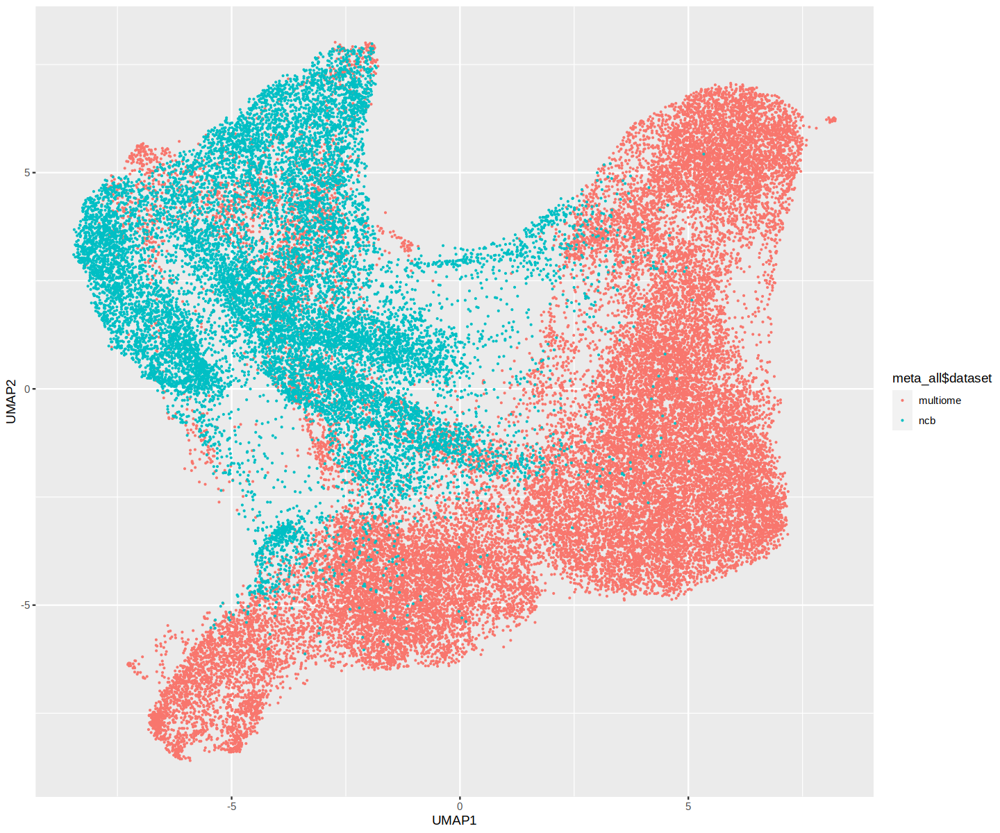

In [223]:
ggplot(umap.dt, aes(UMAP1, UMAP2, color = meta_all$dataset)) + 
    geom_point(size = 0.1)

In [240]:
umap.dt = merge(umap.dt, meta_all, by = 'cell') 

In [245]:
umap.dt = umap.dt[,genotype := gsub('MT', 'KO', genotype)]

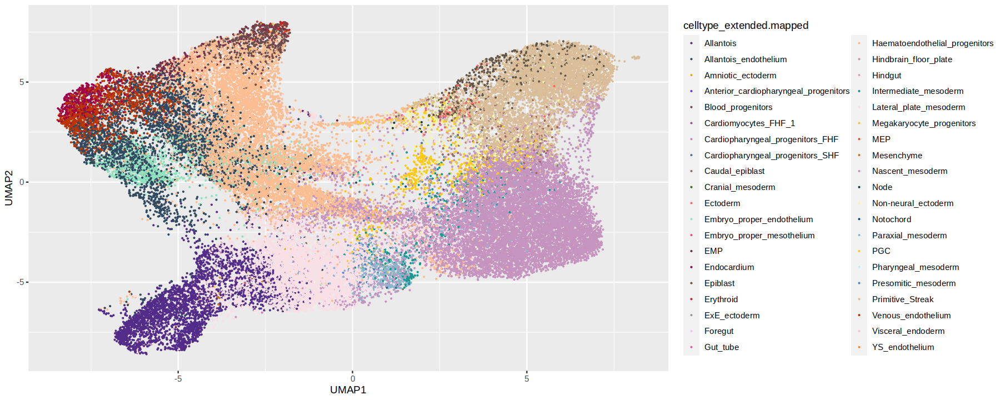

In [241]:
ggplot(umap.dt, aes(UMAP1, UMAP2, color = celltype_extended.mapped)) +
    geom_point(size = 0.1) + 
    scale_color_manual(values = opts$celltype_extended.colors)

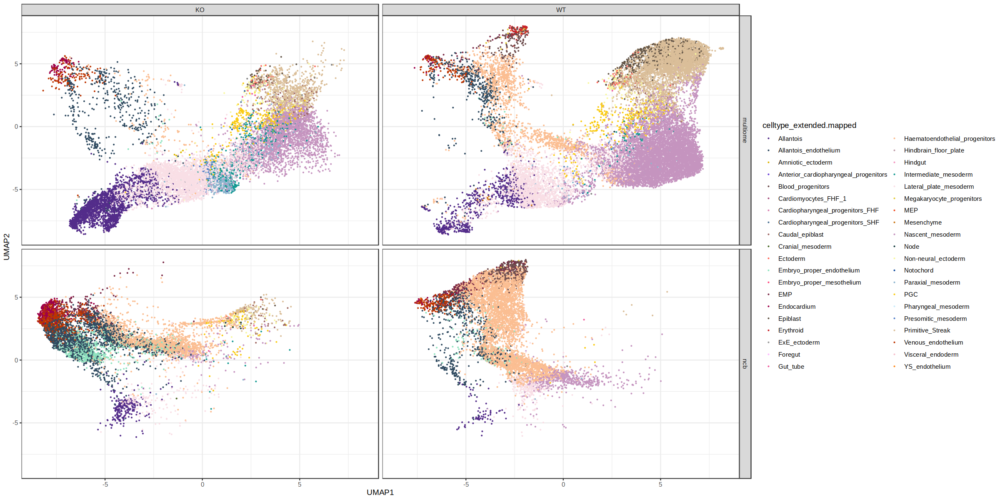

In [247]:
options(repr.plot.width = 20, repr.plot.height=10)
ggplot(umap.dt, aes(UMAP1, UMAP2, color = celltype_extended.mapped)) +
    geom_point(size = 0.1) + 
    scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_grid(cols = vars(genotype), rows = vars(dataset)) + 
    theme_bw()

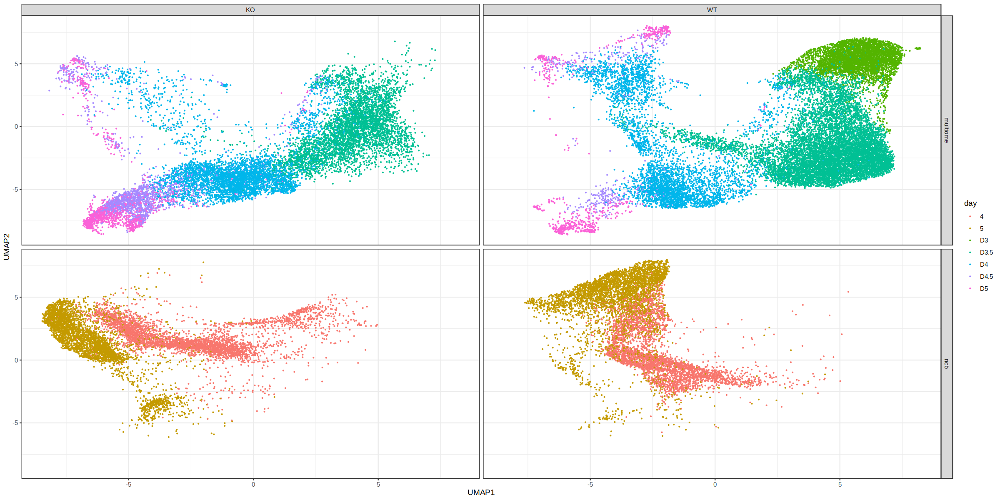

In [250]:
options(repr.plot.width = 20, repr.plot.height=10)
ggplot(umap.dt, aes(UMAP1, UMAP2, color = day)) +
    geom_point(size = 0.1) + 
   # scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_grid(cols = vars(genotype), rows = vars(dataset)) + 
    theme_bw()

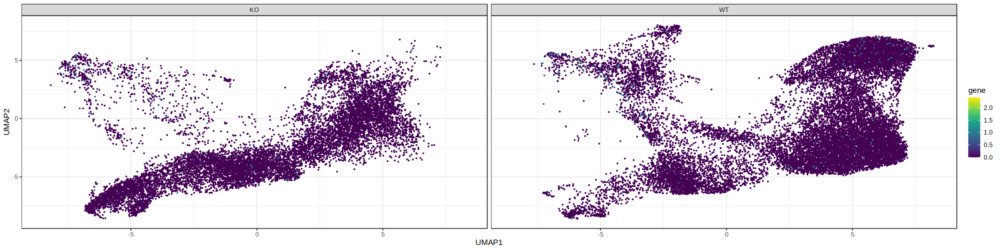

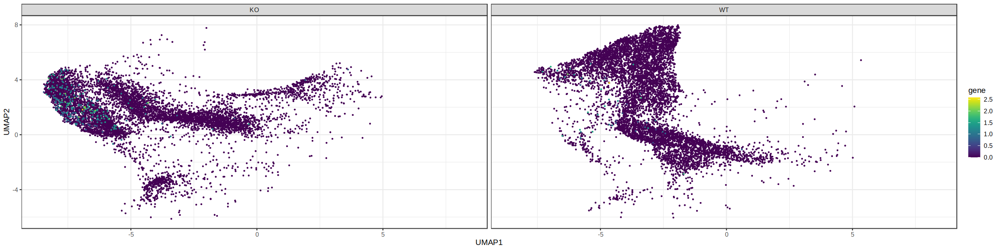

In [311]:
gene = 'Itga2'
options(repr.plot.width = 20, repr.plot.height=5)
umap.dt$gene = as.vector(logcounts(sce_all[gene,umap.dt$cell]))
umap.dt = umap.dt[order(gene)]
ggplot(umap.dt[dataset=='multiome'], aes(UMAP1, UMAP2, color = gene)) +
    geom_point(size = 0.1) + 
    geom_point(size = 0.1) + 
    viridis::scale_color_viridis() + 
    xlim(-8.5, 8.3) + 
    facet_grid(cols = vars(genotype)) + 
    theme_bw()
ggplot(umap.dt[dataset=='ncb'], aes(UMAP1, UMAP2, color = gene)) +
    geom_point(size = 0.1) + 
    geom_point(size = 0.1) + 
    viridis::scale_color_viridis() + 
    xlim(-8.5, 8.3) + 
    facet_grid(cols = vars(genotype)) + 
    theme_bw()

In [313]:
# Plotting on Ivan Haem landscape
io$haem_landscape = '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/results/rna_old/mapping_ivan'
haem_full_landscape = readRDS(file.path(io$haem_landscape, "haem_full_landscape.rds"))

In [426]:
io$biomart = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Mmusculus_genes_BioMart.87.txt'
biomart = fread(io$biomart)[match(rownames(haem_full_landscape), ens_id)]
rownames(haem_full_landscape) = biomart$symbol

In [342]:
haem_full_landscape_meta = as.data.table(colData(haem_full_landscape))

In [323]:
meta_all_v2 = merge(meta_all, haem_full_landscape_meta[,c('cell', 'Dim1', 'Dim2')], by.x = 'closest.cell', by.y = 'cell') %>% 
    .[,genotype := gsub('MT', 'KO', genotype)]

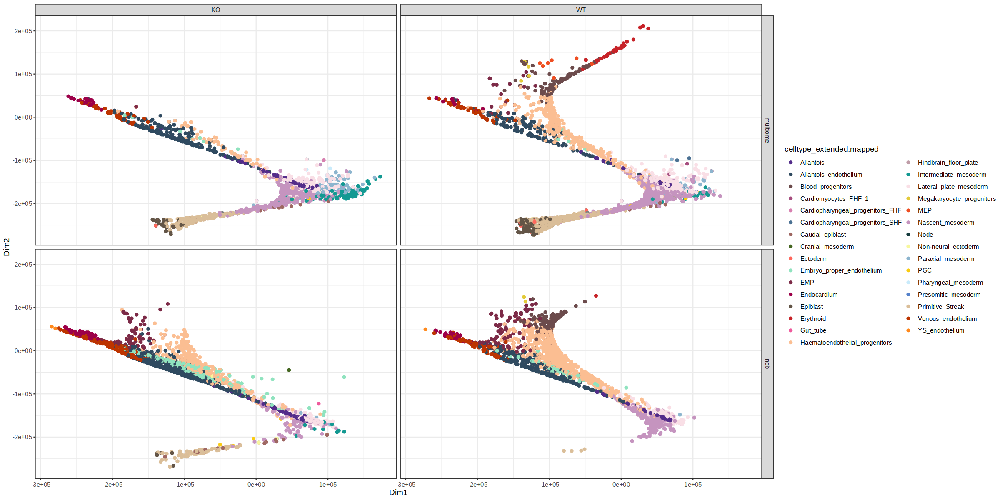

In [325]:
options(repr.plot.width = 20, repr.plot.height=10)

ggplot(meta_all_v2, aes(Dim1, Dim2, color = celltype_extended.mapped)) + 
    geom_point() + 
    scale_color_manual(values = opts$celltype_extended.colors) + 
    facet_grid(cols = vars(genotype), rows = vars(dataset)) + 
    theme_bw()

In [463]:
ncb_seurat = as.Seurat(sce_all[,meta_all$dataset == 'ncb'])

In [464]:
Idents(ncb_seurat) = meta_all[dataset == 'ncb', genotype]

In [465]:
summary(colnames(ncb_seurat) == meta_all[dataset == 'ncb',cell])

   Mode    TRUE 
logical   15220 

In [466]:
markers = FindMarkers(ncb_seurat[,meta_all[dataset == 'ncb' & celltype_extended.mapped %in% c('Endocardium', 'Venous_endothelium', 'YS_endothelium'), cell]], 
                      ident.1 = "MT", ident.2 = 'WT', 
                      only.pos = FALSE,
                      logfc.threshold = 0.2,)

In [468]:
as.data.table(markers, keep.rownames=T)[order(-abs(avg_log2FC))][1:25]

rn,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
H19,1.900583e-55,1.6244102,0.659,0.051,1.256286e-52
Pmp22,4.183492e-59,1.1726770,0.724,0.101,2.765288e-56
Dpysl3,1.474136e-76,-0.8839475,0.124,0.633,9.744037e-74
Skap1,2.941122e-61,-0.8503224,0.146,0.595,1.944082e-58
Slc16a3,1.972735e-36,0.7520644,0.722,0.266,1.303978e-33
Ifitm1,1.260239e-36,0.7458574,0.765,0.359,8.330177e-34
Akap12,3.111296e-39,0.7258541,0.811,0.380,2.056567e-36
Ifitm3,1.257465e-54,0.6848468,0.960,0.654,8.311841e-52
Ctsh,1.186652e-30,0.6792651,0.669,0.257,7.843767e-28


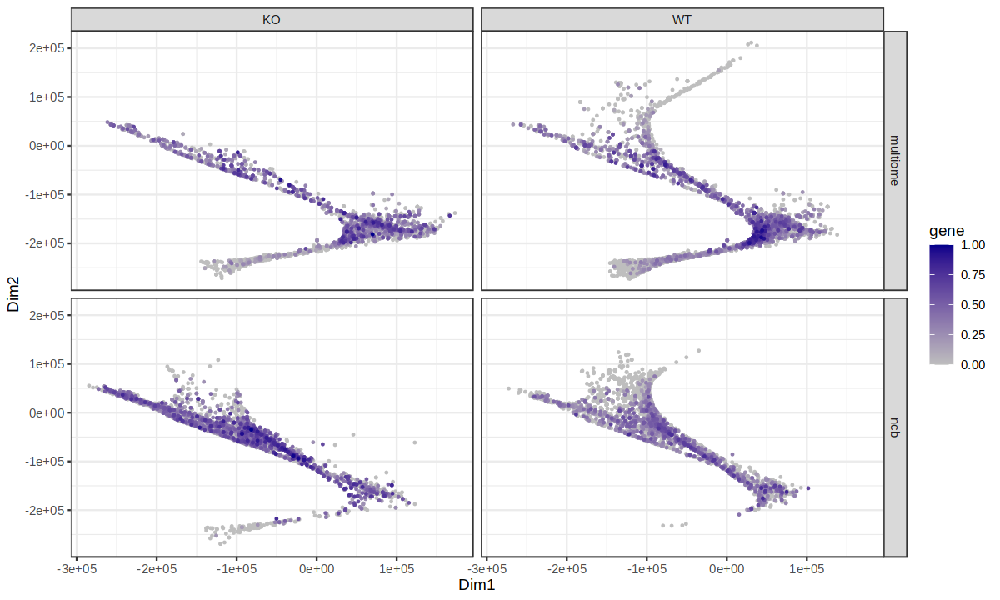

In [482]:
gene = 'Cyp26a1'

# haem_full_landscape_meta = as.data.table(colData(haem_full_landscape))
# haem_full_landscape_meta$gene = as.vector(logcounts(haem_full_landscape[gene,]))
# # Order by Eomes expression
# haem_full_landscape_meta = haem_full_landscape_meta[order(gene)]
# options(repr.plot.width = 8, repr.plot.height=5)

# p = ggplot(haem_full_landscape_meta, aes(Dim1, Dim2, col=gene)) + 
#         geom_point(size=0.2, alpha = 0.5) +
#         scale_colour_gradient(low='grey', high='darkblue') + 
#         theme_void() +
#         theme(panel.grid = element_line(color='grey95'))
# p

options(repr.plot.width = 10, repr.plot.height=6)
meta_all_v2$gene = as.vector(logcounts(sce_all[gene,meta_all_v2$cell]))
meta_all_v2 = meta_all_v2[order(gene)] %>%
    .[,gene := minmax.normalisation(gene), by=dataset]

ggplot(meta_all_v2, aes(Dim1, Dim2, color = gene)) + 
    geom_point(size = 0.3) + 
    scale_colour_gradient(low='grey', high='darkblue') + 
    # viridis::scale_color_viridis() + 
    facet_grid(cols = vars(genotype), rows = vars(dataset)) + 
    theme_bw()

In [471]:
ncb_seurat = as.Seurat(sce_all[,meta_all$dataset == 'multiome'])

In [472]:
Idents(ncb_seurat) = meta_all[dataset == 'multiome', genotype]

In [473]:
markers = FindMarkers(ncb_seurat[,meta_all[dataset == 'multiome' & celltype_extended.mapped %in% c('Endocardium', 'Venous_endothelium', 'YS_endothelium'), cell]], 
                      ident.1 = "KO", ident.2 = 'WT', 
                      only.pos = FALSE,
                      logfc.threshold = 0.2,)

In [476]:
as.data.table(markers, keep.rownames=T)[order(-abs(avg_log2FC))][1:15]

rn,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Hbb-bh1,2.197054e-40,-1.1533366,0.004,0.614,1.452253e-37
Hba-x,1.172979e-30,-1.0551459,0.000,0.481,7.753392e-28
Dlk1,1.775200e-19,0.7375728,0.724,0.323,1.173407e-16
Fbn1,1.951346e-18,-0.5296836,0.800,0.937,1.289840e-15
Cldn5,3.841296e-14,0.5264064,0.804,0.468,2.539097e-11
Meg3,3.958680e-11,0.4793102,0.960,0.816,2.616688e-08
Runx1,1.552506e-17,-0.4748067,0.267,0.652,1.026207e-14
Hecw2,4.291175e-10,0.4377156,0.733,0.411,2.836467e-07
Piezo2,1.595606e-06,0.4210686,0.604,0.411,1.054696e-03


In [14]:
sce = eomes_ncb_sce
sample_metadata = eomes_ncb_meta_full

In [135]:
gene_metadata <- fread(io$gene_metadata) %>% .[,c("chr","ens_id","symbol")] %>%
  .[symbol!="" & ens_id%in%rownames(sce)] %>%
  .[!duplicated(symbol)]

# Imprinted genes
imprint = gene_metadata[c(grep('maternally', gene_metadata$description),
                       grep('paternally', gene_metadata$description)), symbol]
# Other imprinted genes: 
#- Nnat (https://www.genecards.org/cgi-bin/carddisp.pl?gene=NNAT)
#- Grb10 (https://www.genecards.org/cgi-bin/carddisp.pl?gene=GRB10)

# Filter some genes manually
genes_keep = rownames(sce)
genes_keep <- genes_keep[grep("^Rik|Rik$|^mt-|^Rps|^Rpl|^Gm",genes_keep,invert=T)] # filter out non-informative genes
genes_keep <- genes_keep[grep("^Hbb|^Hba",genes_keep,invert=T)] # test removing Haem genes 

hvgs = VariableFeatures(FindVariableFeatures(eomes_ncb_seurat[genes_keep], nfeatures = 1000))
sce_filt <- sce[hvgs,]

In [136]:
logcounts(sce_filt) <- RegressOutMatrix(
     mtx = logcounts(sce_filt), 
     covariates = colData(sce_filt)[,c('nCount_RNA', 'nFeature_RNA', 'percent.mt'),drop=F]
   )

In [145]:
#pca <- multiBatchPCA(sce_filt, batch = colData(sce_filt)[['orig.ident']], d = 15)
# reducedDim(sce_filt, "PCA") <- pca
sce_filt <- runPCA(sce_filt, ncomponents = 4, ntop=1000)  

In [146]:
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 30, min_dist = 0.3)

In [147]:
to.plot <- reducedDim(sce_filt,"UMAP") %>% as.data.table %>% 
    .[,cell:=colnames(sce_filt)] %>%
    merge(sample_metadata, by="cell")
    

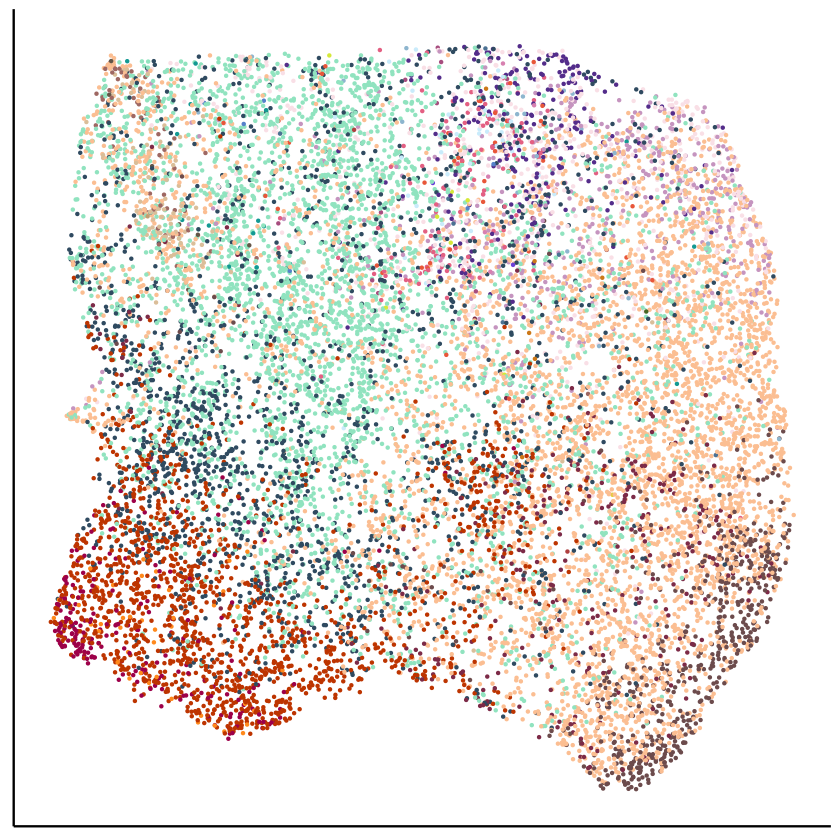

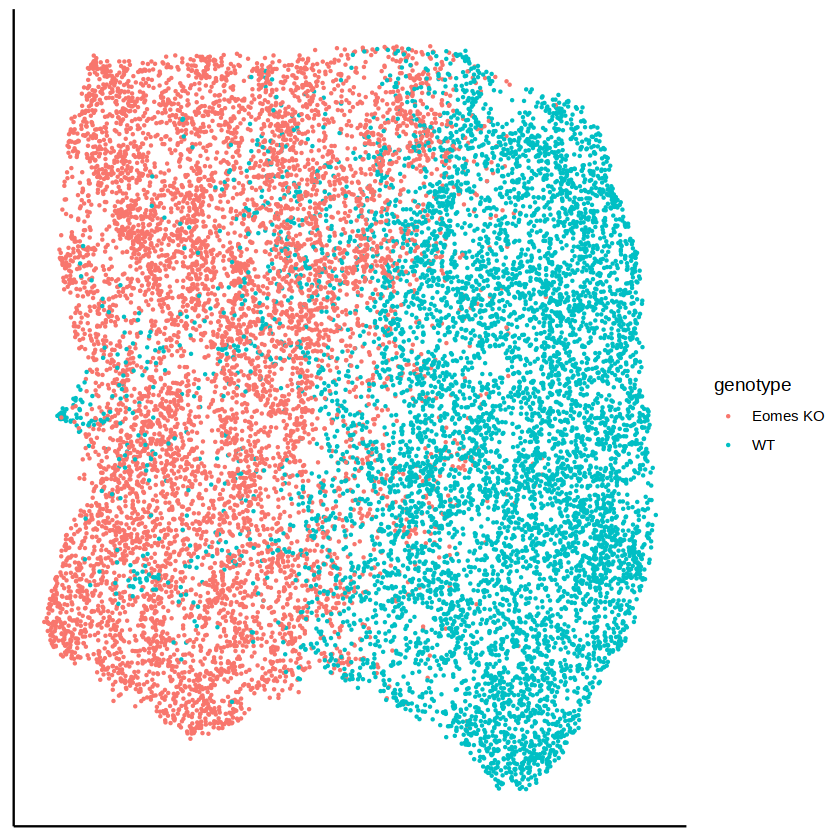

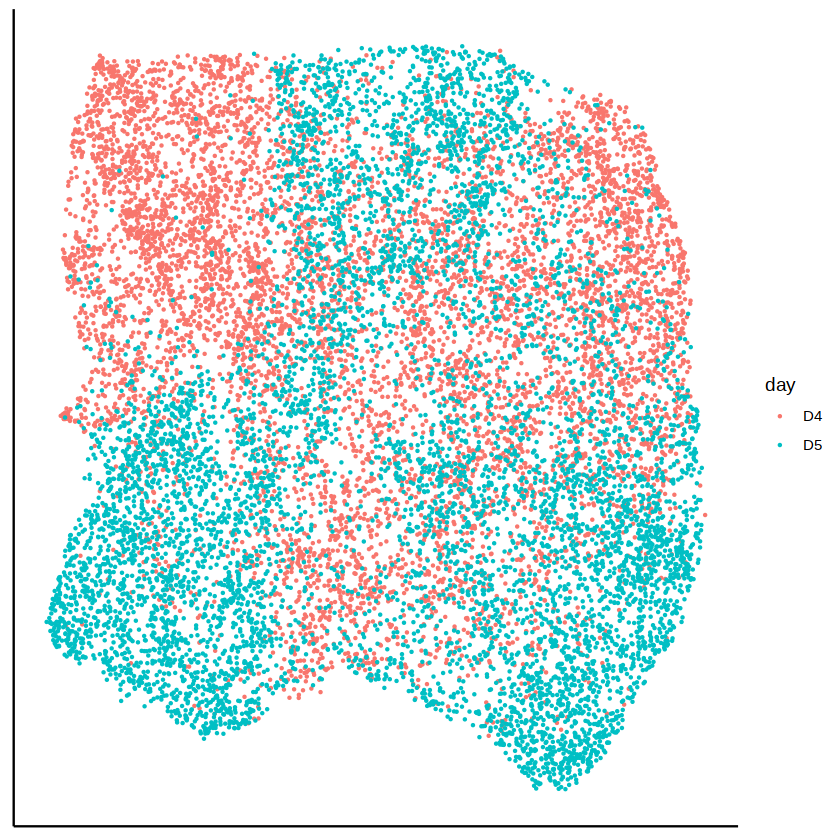

In [148]:
colors = opts$celltype_extended.colors
names(colors) = gsub('_', ' ', names(colors))
p <- ggplot(to.plot, aes(x=V1, y=V2, col=celltype.mapped_ext)) +
    geom_point(size=0.2) +
    scale_color_manual(values=colors) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'none'
    )
p

p <- ggplot(to.plot, aes(x=V1, y=V2, col=genotype)) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'right'
    )
p
p <- ggplot(to.plot, aes(x=V1, y=V2, col=day)) +
    geom_point(size=0.2) +
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'right'
    )
p

In [149]:
sce

class: SingleCellExperiment 
dim: 17941 15220 
metadata(0):
assays(2): counts logcounts
rownames(17941): Xkr4 Sox17 ... Nrap Pnliprp1
rowData names(0):
colnames(15220): D4WT_AAACCCAAGCGTATAA D4WT_AAACCCACAAGACAAT ...
  D5MT_GTCAGCGCAGGCACAA D5MT_TATGTTCAGGTTAGTA
colData names(9): orig.ident nCount_RNA ... seurat_clusters ident
reducedDimNames(0):
mainExpName: RNA
altExpNames(1): integrated

In [150]:
summary(colnames(sce) == to.plot$cell)

   Mode   FALSE 
logical   15220 

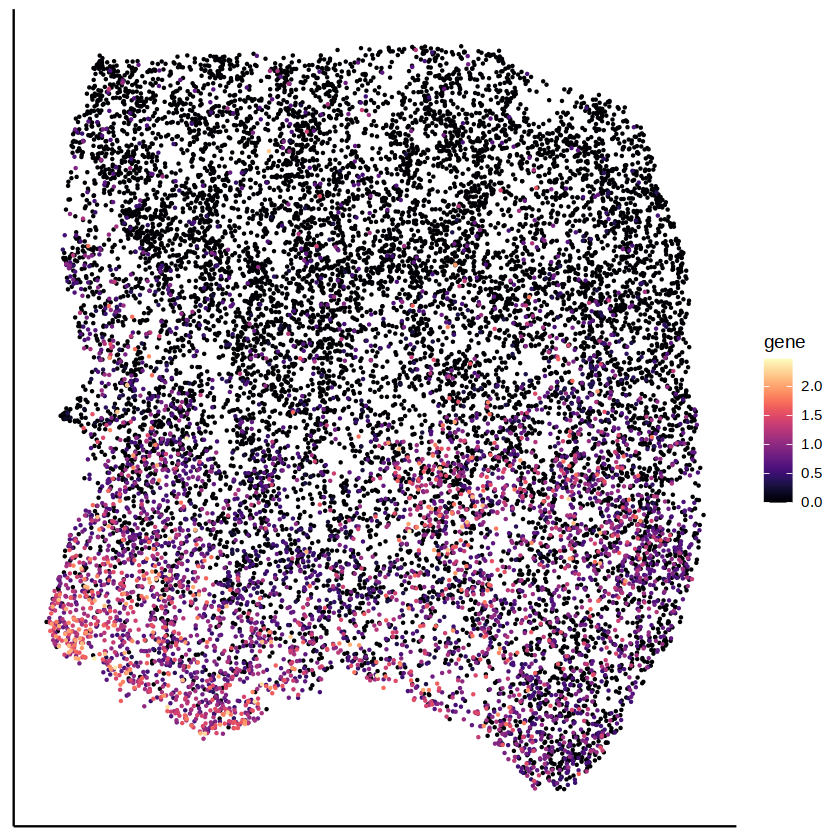

In [151]:
to.plot$gene = as.vector(logcounts(sce['Cdh5',to.plot$cell]))
to.plot = to.plot[order(gene)]
ggplot(to.plot, aes(x=V1, y=V2, col=gene)) +
    geom_point(size=0.2) +
    scale_color_viridis(option = 'magma') + 
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'right'
    )

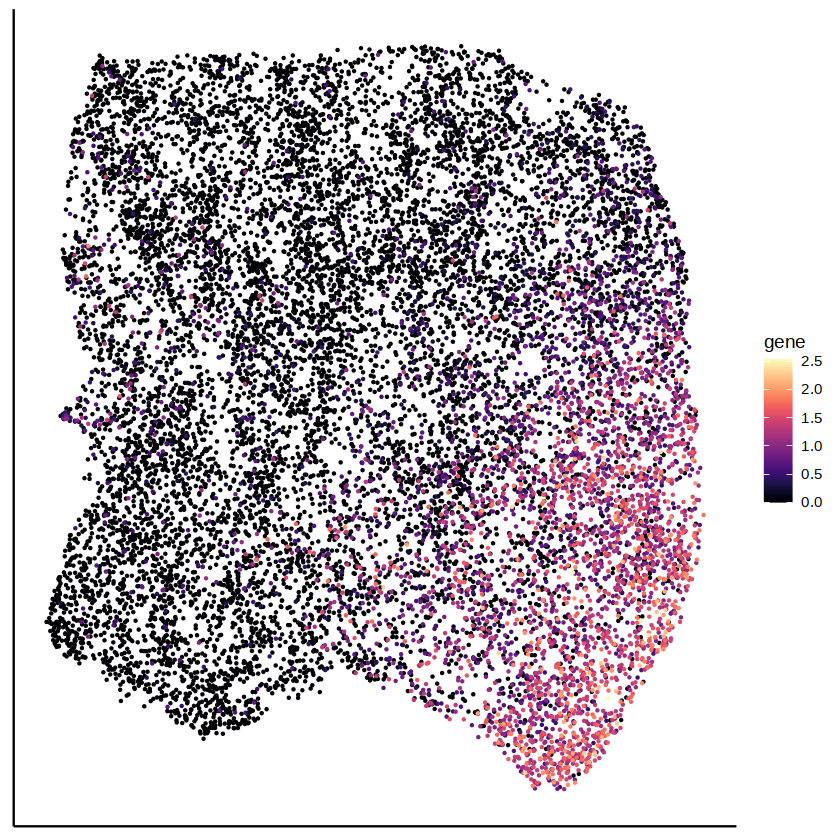

In [152]:
to.plot$gene = as.vector(logcounts(sce['Runx1',to.plot$cell]))
to.plot = to.plot[order(gene)]
ggplot(to.plot, aes(x=V1, y=V2, col=gene)) +
    geom_point(size=0.2) +
    scale_color_viridis(option = 'magma') + 
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'right'
    )

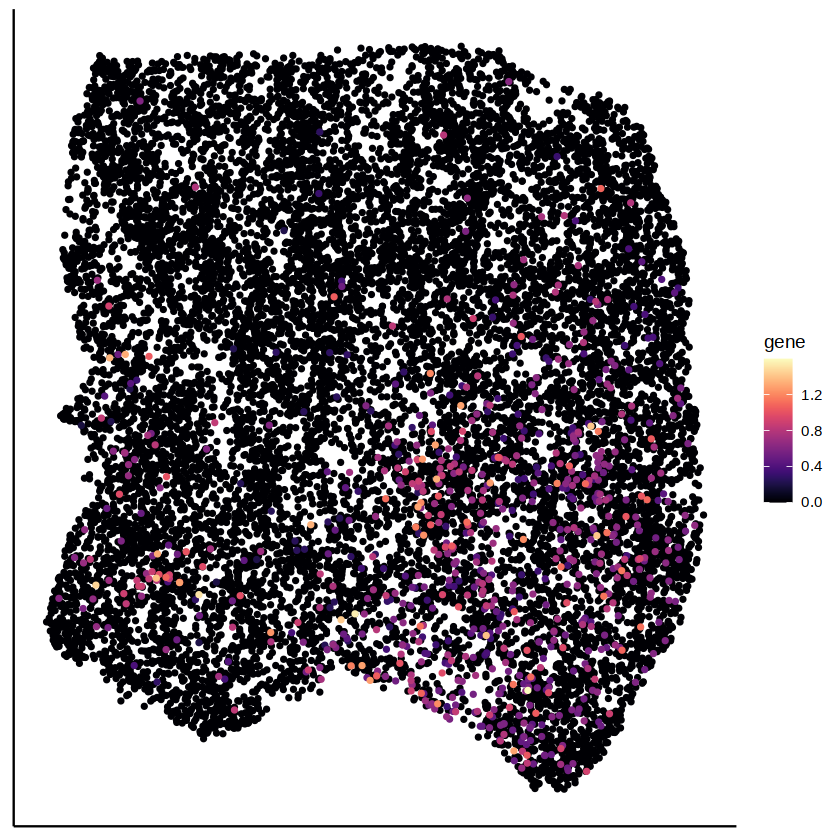

In [178]:
to.plot$gene = as.vector(logcounts(sce['Oit3',to.plot$cell]))
to.plot = to.plot[order(gene)]
ggplot(to.plot, aes(x=V1, y=V2, col=gene)) +
    geom_point(size=1) +
    scale_color_viridis(option = 'magma') + 
    theme_classic() +
    theme(
      axis.title = element_blank(),
      axis.text = element_blank(),
      axis.ticks = element_blank(),
        legend.position = 'right'
    )